In [39]:
from __future__ import print_function, division

import torch
import torch.utils as utils
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from PIL import Image

from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import pandas as pd
import torchvision
from tqdm import tqdm
from torchvision import datasets, models, transforms
import torchvision.transforms as T
# import matplotlib.pyplot as plt
import time
import os
import copy

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

import heapq
import math
import cv2

In [40]:
# cropped image 경로 입력
data_dir = '/Users/perspector/Desktop/DataCampus/K-Fashion'
data_transform = transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

image_dataset =  datasets.ImageFolder(data_dir, data_transform)

train_split = 0.7
split_size = int(len(image_dataset) * train_split)
batch_size = 16
num_workers= 6

train_set, valid_set = torch.utils.data.random_split(image_dataset, [split_size, len(image_dataset) - split_size])
tr_loader = utils.data.DataLoader(dataset=train_set,
                            batch_size=batch_size,
                            shuffle=True,
                            num_workers=num_workers)
val_loader = utils.data.DataLoader(dataset=valid_set,
                              batch_size=batch_size,
                              shuffle=False,
                              num_workers=num_workers)
dataloaders = {'train': tr_loader, 'val':val_loader}
dataset_sizes = {}
dataset_sizes['train'] = split_size
dataset_sizes['val'] = len(image_dataset) -split_size
class_names = image_dataset.classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

def train_model(model, criterion, optimizer, scheduler, num_epochs=2):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    model.load_state_dict(best_model_wts)
    return model

model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features

model_ft.fc = nn.Linear(num_ftrs, len(image_dataset.classes))
model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

/Users/perspector/Desktop/DataCampus/kdata_fashion/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/perspector/Desktop/DataCampus/kdata_fashion/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [41]:
# # 모델 저장하는 경로 및 모델명 입력
# PATH = '/content/drive/MyDrive/Recommendation/'
# torch.save(model_ft, PATH + 'modified_model.pt')

from torchvision.transforms import ToTensor
tf_toTensor = ToTensor()

# 스타일 분류 모델 사용 함수
def style_result(INPUT, MODEL_PATH, device, class_names):

    img = Image.open(INPUT).convert('RGB')
    img = img.resize((224, 224))
    tensor_img = tf_toTensor(img)
    tensor_img = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(tensor_img)
    tensor_img = torch.reshape(tensor_img, [-1, 3, 224, 224])

    model = torch.load(MODEL_PATH, map_location=device)
    model_pr = model.eval()

    pred = model_pr(tensor_img).argmax()
    pred_style = class_names[pred]

    return {'class':pred, 'style':pred_style}



In [42]:
#추천
# 두 개의 사진에 대하여 유사도를 도출하는 함수

## 딥러닝 version
def calculate_deep_similarity(image_path1, image_path2):
    model = VGG16(weights='imagenet', include_top=False)

    img1 = image.load_img(image_path1, target_size=(224, 224))
    img2 = image.load_img(image_path2, target_size=(224, 224))

    img1_array = preprocess_input(np.expand_dims(image.img_to_array(img1), axis=0))
    img2_array = preprocess_input(np.expand_dims(image.img_to_array(img2), axis=0))

    features1 = model.predict(img1_array)
    features2 = model.predict(img2_array)

    similarity = np.dot(features1.flatten(), features2.flatten()) / (np.linalg.norm(features1) * np.linalg.norm(features2))

    return similarity

## pixel version
def resize_image(image_path, target_size):
    img = Image.open(image_path)
    img = img.resize(target_size, Image.ANTIALIAS)
    return img

def calculate_pixel_similarity(image_path1, image_path2, target_size=(224,224)):
    img1 = resize_image(image_path1, target_size)
    img2 = resize_image(image_path2, target_size)

    pixels1 = np.array(img1)
    pixels2 = np.array(img2)

    pixels1 = pixels1 / 255.0
    pixels2 = pixels2 / 255.0

    pixel_diff = np.abs(pixels1 - pixels2)

    similarity = 1.0 - np.mean(pixel_diff)

    return similarity

# score 상위 n개 도출

def top_n_indices(arr, n):

    top_indices = []

    heap = [(-value, index) for index, value in enumerate(arr)]
    heapq.heapify(heap)

    for _ in range(n):
        neg_value, index = heapq.heappop(heap)
        top_indices.append(index)

    return top_indices

# 미리 학습된 Mask R-CNN 모델 로드 -> crop할 때 사용
model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

# 모델을 평가 모드로 설정
model.eval()

# bounding box가 여러 개가 나올 수 있으므로, 확률 값이 가장 큰 bounding box의 index 값을 추출하는 함수 정의
def find_max_index(tensor):
    max_value, max_index = torch.max(tensor, dim=0)
    return max_index.item()

# crop하고 정사각형으로 만드는 함수 -
def crop_and_color(original_path, middle_path, output_path):
    img = Image.open(original_path).convert('RGB')
    transform = T.Compose([T.ToTensor()])
    input_image = transform(img)
    input_image = input_image.unsqueeze(0)

    with torch.no_grad():
        prediction = model(input_image)

    boxes = prediction[0]['boxes'] # bounding box 좌표
    scores = prediction[0]['scores'] # 객체의 확률 값들

    bounding_box = boxes[find_max_index(scores)]

    # 텐서에서 바운딩 박스 좌표 얻기
    x_min, y_min, x_max, y_max = bounding_box

    # 텐서를 정수로 반환(인덱싱 하려고)
    x_min = math.floor(x_min.item())
    y_min = math.floor(y_min.item())
    x_max = math.floor(x_max.item())
    y_max = math.floor(y_max.item())

    # 이미지 읽기
    image = cv2.imread(original_path)

    # 바운딩 박스 좌표를 이용하여 이미지 crop
    cropped_image = image[y_min:y_max, x_min:x_max]

    # crop 이미지 저장
    cv2.imwrite(middle_path, cropped_image)

    # 정사각형으로 만들기
    image = Image.open(middle_path)

    img_size = image.size # 이미지의 크기 측정
    x = img_size[0] # 넓이값
    y = img_size[1] # 높이값

    if x != y:
        size = max(x, y)
        resized_img = Image.new(mode = 'RGB', size = (size, size), color = (255, 255, 255))
        offset = (round((abs(x - size)) / 2), round((abs(y - size)) / 2))
        resized_img.paste(image, offset)

        resized_img.save(output_path,'PNG')

# 희귀한 스타일의 경우 다른 스타일로 대체하는 함수
def change_style(style_number):
    modified_style = [0,19,19,7,6,22,6,7,8,9,10,11,7,16,0,6,16,7,22,19,10,11,22]
    return modified_style[style_number]

# style 번호를 입력하면 그에 맞는 쇼핑몰을 반환하는 함수
def return_table(style_number):
    return shopping_mall_list[shopping_mall_list['style'] == style_number]


# 최종 함수

shopping_mall_list = pd.read_excel('/Users/perspector/Desktop/DataCampus/Recommendation/쇼핑몰 분류_revised.xlsx') # shopping_mall별 분위기 데이터
crawling_data_path = '/Users/perspector/Desktop/DataCampus/쇼핑몰/' # 인스타 쇼핑몰 크롤링 데이터

def similar_style(image_path, model_path, similarity_func):

  image_category = style_result(image_path, model_path,'cpu',class_names)['class'].numpy().item()
  sorted_same_style_mall = shopping_mall_list[shopping_mall_list['style'] == image_category].sort_values(by='proportion', ascending=False).head(3)

  if sorted_same_style_mall.shape[0] <= 2:
    sorted_same_style_mall = pd.concat([return_table(image_category), return_table(change_style(image_category))]).sort_values(by='proportion', ascending=False).head(3)

  image_list = []; score_list = []; top_score = []; output = []

  for i in range(len(sorted_same_style_mall['mall'].to_list())):
    target_mall = str(sorted_same_style_mall['mall'].to_list()[i])
    style_name = shopping_mall_list[shopping_mall_list['mall'] == target_mall]['style_name'].iloc[0]

    folder_path = crawling_data_path + style_name + '/' + str(sorted_same_style_mall['mall'].to_list()[i])
    image_lists = []; score = []
    for filename in os.listdir(folder_path):
      file_path = os.path.join(folder_path, filename)

      if os.path.isfile(file_path) and filename.lower().endswith(('.jpg')):
          image_lists.append(file_path)

      similarity_score = similarity_func(image_path, file_path)
      score.append(similarity_score)
    image_list.append(image_lists); score_list.append(score)
    top_score.append(top_n_indices(score_list[i],3))
    output.append([image_list[i][index] for index in top_score[i]])

  for number, i in enumerate(output):
    print(); print(f"{number+1}번째 쇼핑몰: {sorted_same_style_mall['mall'].to_list()[number]}"); print()
    for j in i:
      image_ = Image.open(j)
      display(image_); print()

  style = {'style' : class_names[image_category]}
  shopping_malls = pd.DataFrame({'shopping_mall' : sorted_same_style_mall['mall'].to_list(), 'instagram_ID' : sorted_same_style_mall['instagram_ID'].to_list()})

  return style, shopping_malls

/Users/perspector/Desktop/DataCampus/kdata_fashion/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/perspector/Desktop/DataCampus/kdata_fashion/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


1/1 [==============================] - 0s 188ms/step

1번째 쇼핑몰: 큐니걸스



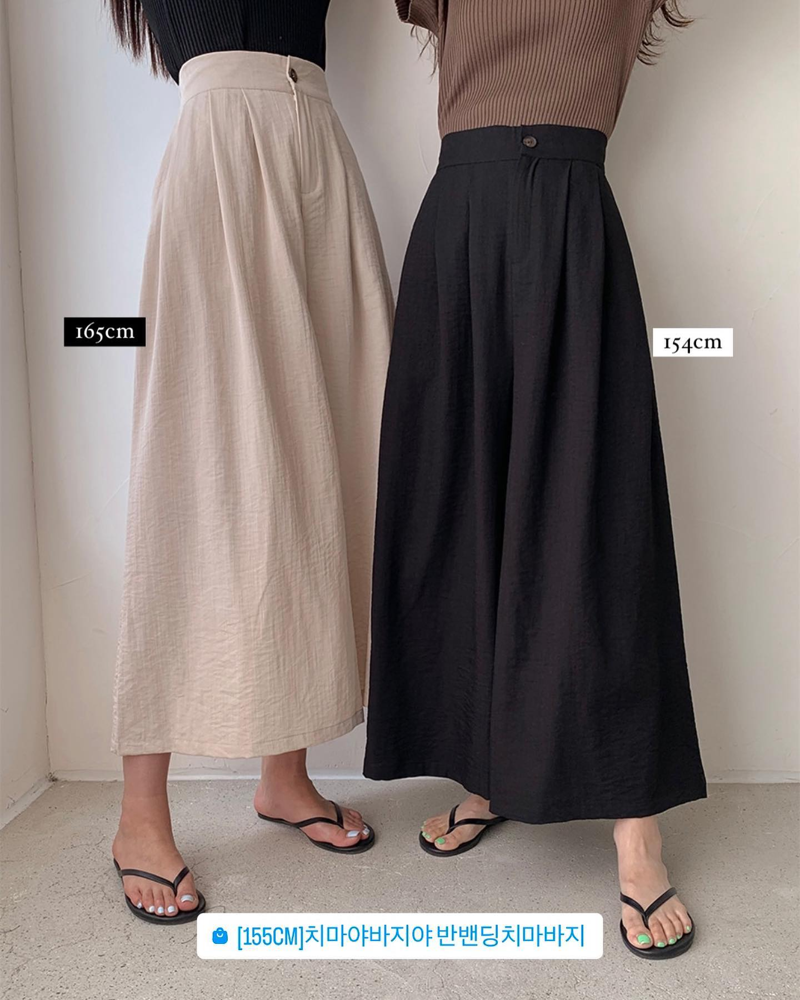

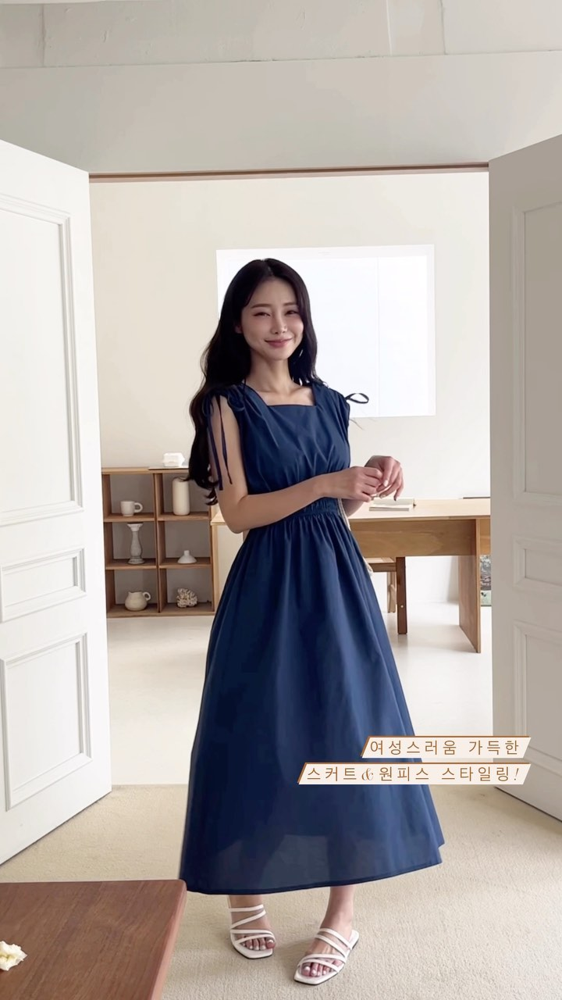

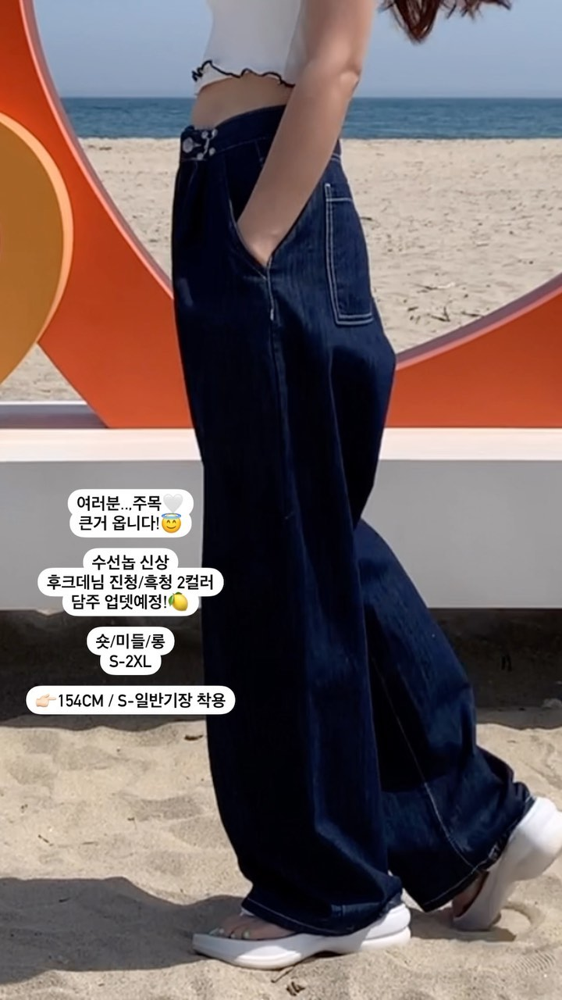



2번째 쇼핑몰: 르뚜앙



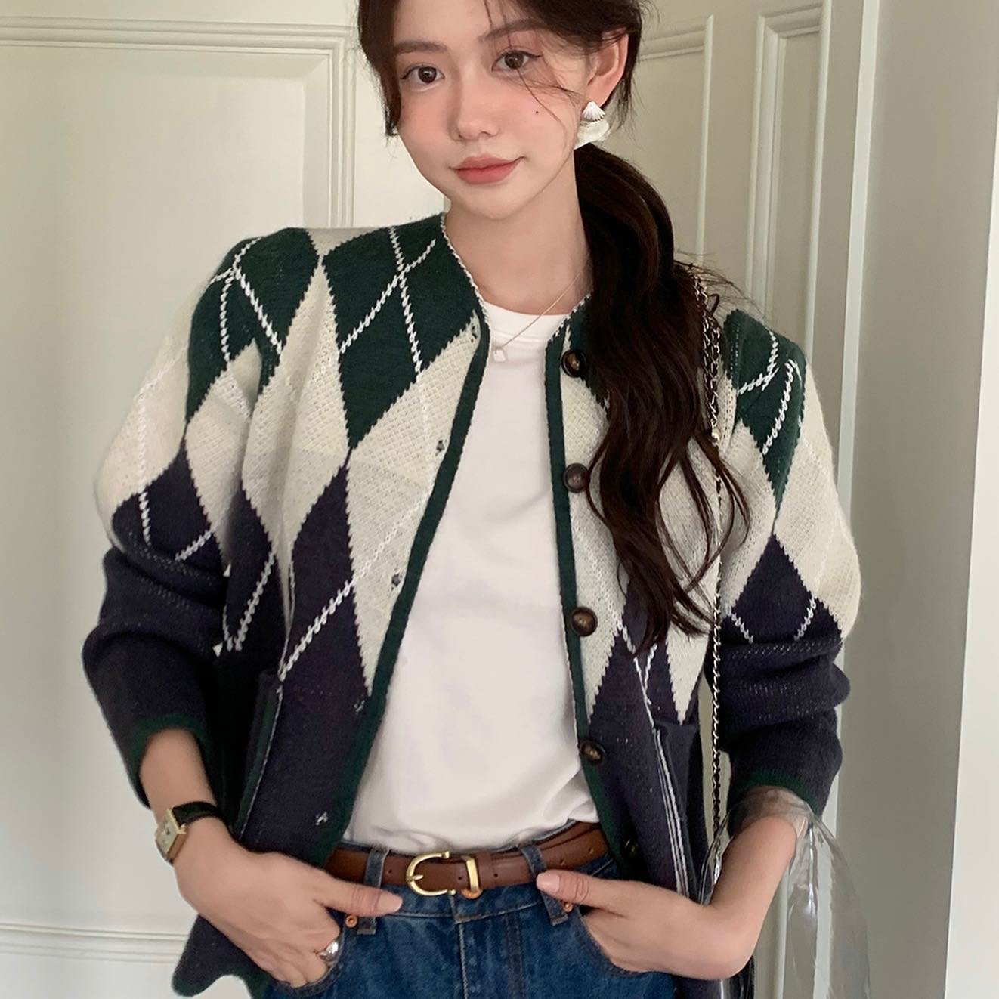

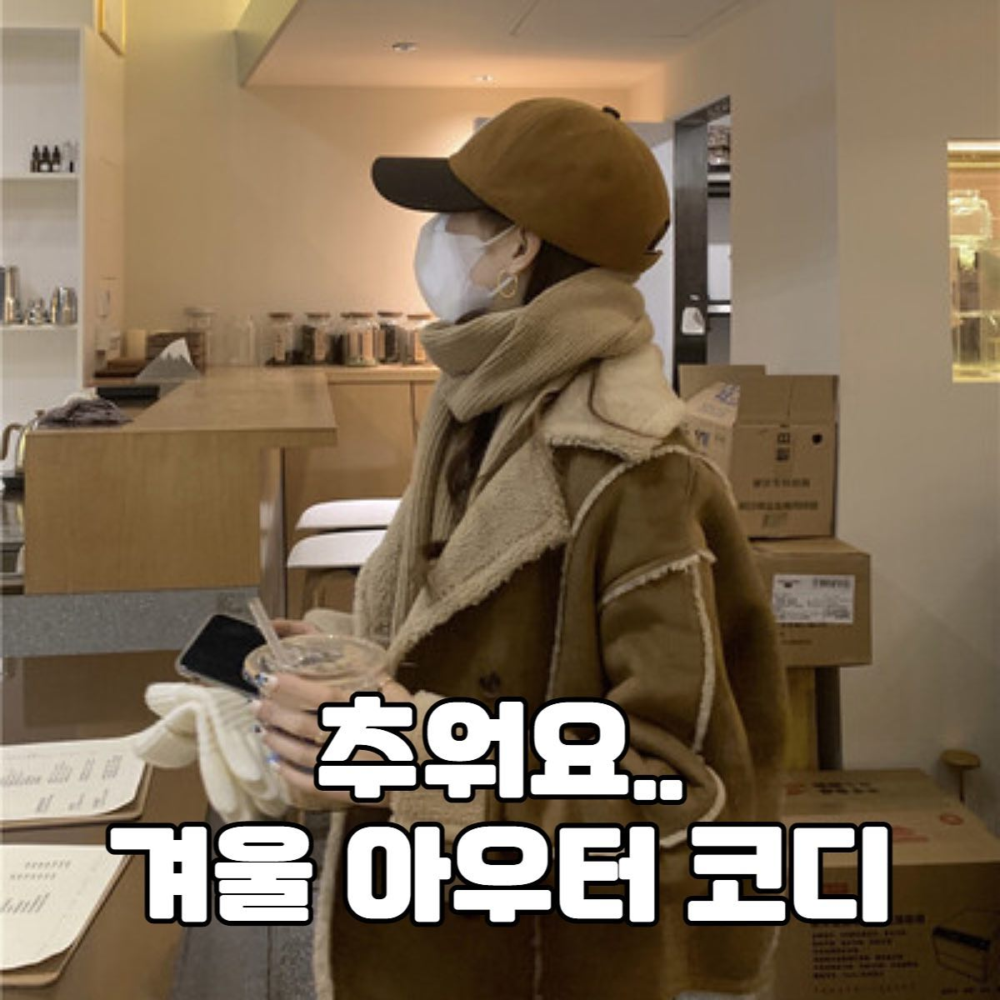

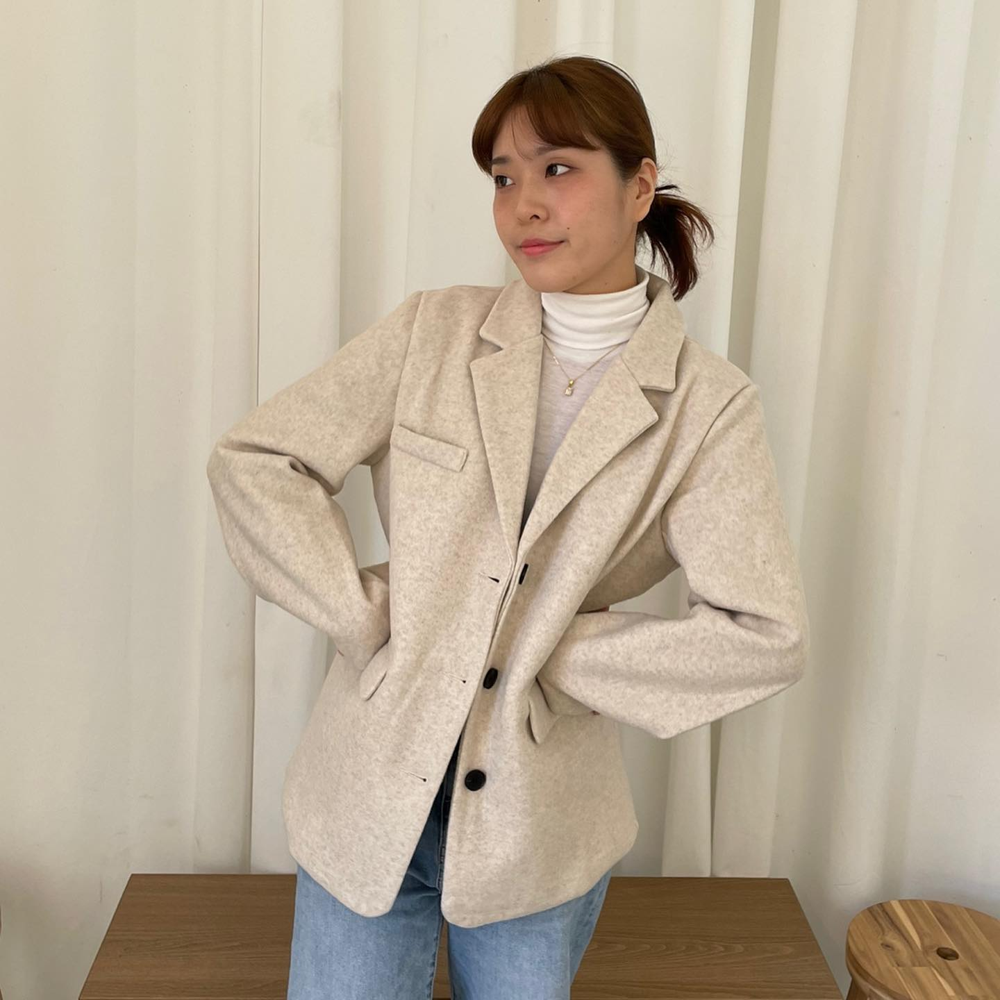



3번째 쇼핑몰: 인더클로젯



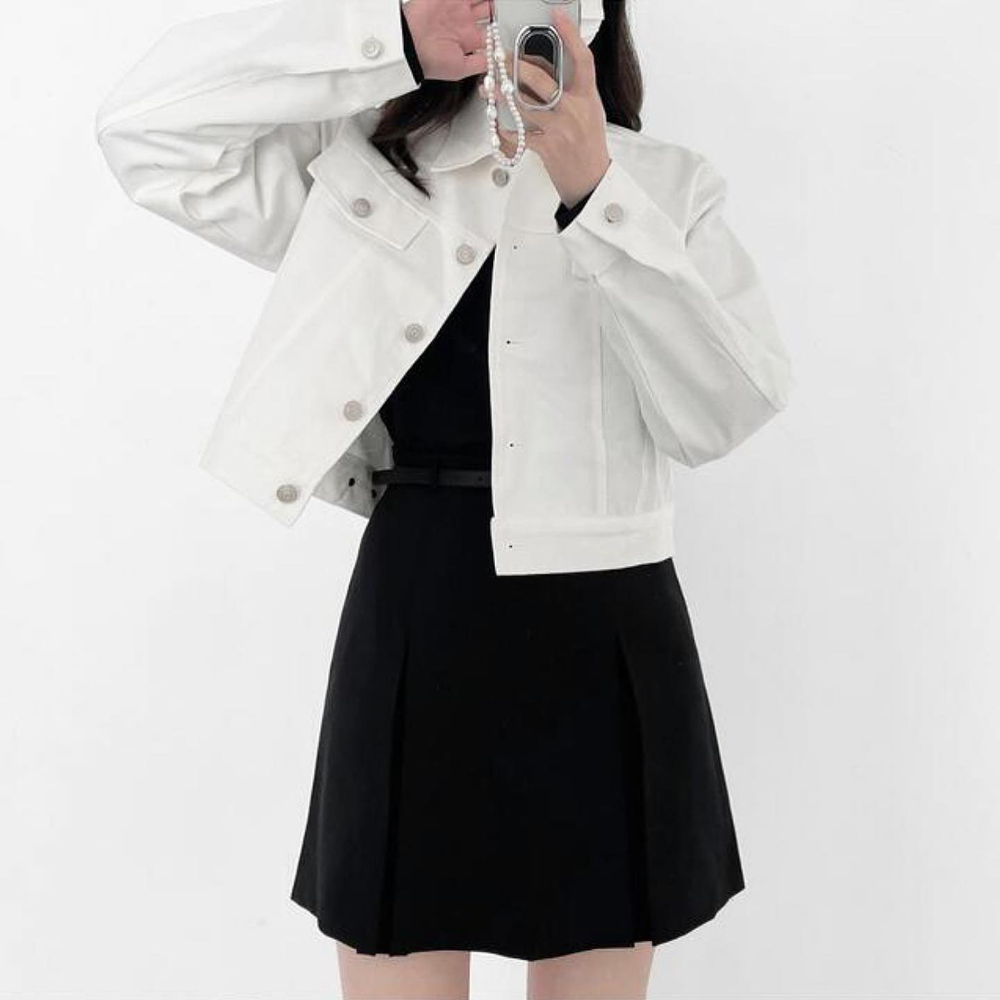

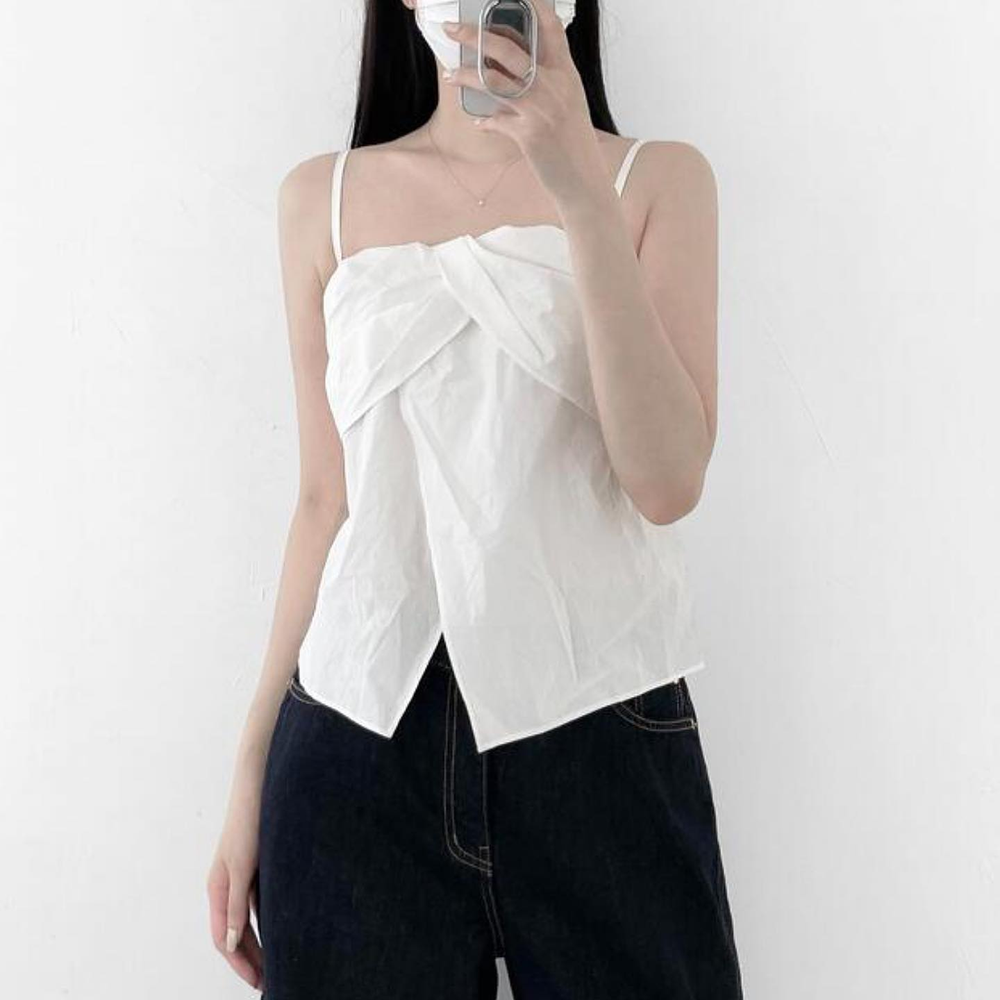

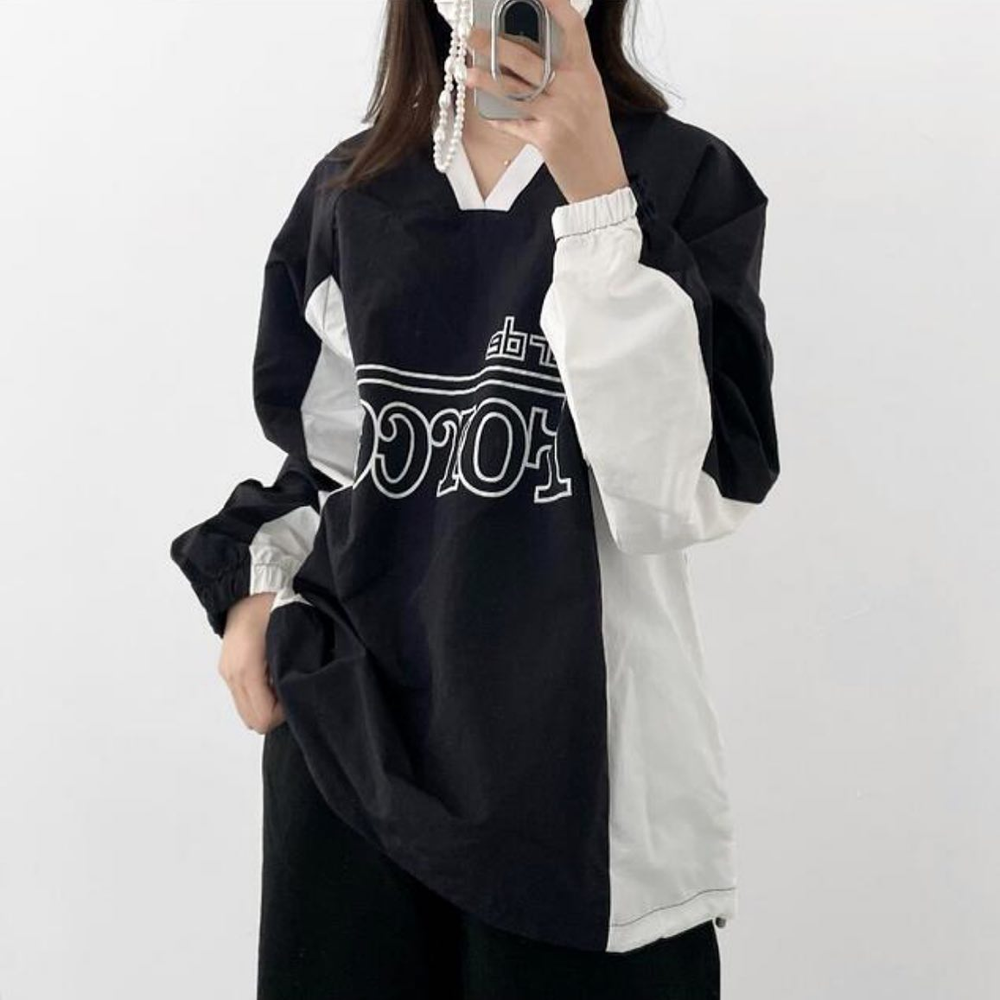


{'style': '힙합'}


,shopping_mall,instagram_ID
0,큐니걸스,qnigirls_official
1,르뚜앙,hrhwilda
2,인더클로젯,inthecloset_insta


In [43]:
input_path = '/Users/perspector/Desktop/DataCampus/Recommendation/example_5.jpg' # 원본 사진 경로
middle_path = '/Users/perspector/Desktop/DataCampus/Recommendation/example_5_cropped.jpg' # crop 이미지 저장 경로
output_path = '/Users/perspector/Desktop/DataCampus/Recommendation/example_5_cropped_color.jpg' # 최종 전처리 완료 이미지 경로

MODEL_PATH = '/Users/perspector/Desktop/DataCampus/Recommendation/modified_model.pt'

# crop후 정사각형으로 만들기
crop_and_color(input_path, middle_path, output_path)

# 최종 결과물
style, shopping_malls = similar_style(output_path, MODEL_PATH, calculate_deep_similarity)
print(style); shopping_malls